# Tutorial - Creating Embeddings from a Pretrained ResNet34

#### Author: Antonio Rueda-Toicen
**antonio.rueda.toicen 'at' hpi 'dot' de**


[![Creative Commons License](https://i.creativecommons.org/l/by/4.0/88x31.png)](http://creativecommons.org/licenses/by/4.0/)

This work is licensed under a [Creative Commons Attribution 4.0 International License](http://creativecommons.org/licenses/by/4.0/).

## Creating Image Embeddings from a Resnet34

In this notebook, we use a pretrained Resnet34 to extract image embeddings from a dataset. This will allow us to inspect the similarity of its images, cluster them, deduplicate them, and evaluate their uniqueness.


### Mounting Google Drive and Reading Image Urls

This part of the code is responsible for mounting Google Drive, allowing us to access files stored there.

In [48]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).




This section reads a list of image URLs from a file. These URLs will be used to download the images.

In [49]:
from pathlib import Path
import os
artist_name = 'banksy'
path = Path(f'/gdrive/MyDrive/art_recommendation/{artist_name}')

### Importing Image Libraries

We'll start by importing the necessary libraries that will help us in manipulating images and working with images.

In [50]:
import skimage.io as io
from PIL import Image

image_paths = os.listdir(path / "paintings")
img_array =io.imread(path / "paintings" / image_paths[0])
img_array.shape

(387, 580, 3)

### Loading an Image

Here, we'll load an image from an array and convert it into a format suitable for further processing.

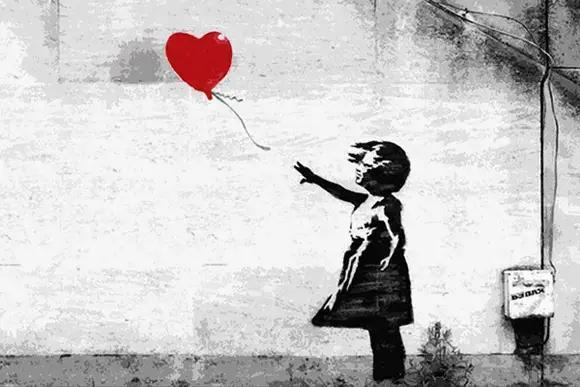

In [51]:
image = Image.fromarray(img_array)
image

### Defining and Initializing Image Embedding Model

We will define a model that can convert images into numerical vectors called embeddings. This model is then initialized for usage. **Don't worry about the details of this model.** For now, you can treat it as a black box that turns images into vectors of numbers. Similar images will turn into vectors that are close to each other.

In [52]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.models import ResNet34_Weights
from PIL import Image

# Load the pretrained ResNet34 model
model = models.resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)

# Remove the final classification layer to get embeddings
model = torch.nn.Sequential(*list(model.children())[:-1])

# Set model to evaluation mode
model.eval()

# Define the image transformation
transform = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# Function to extract embeddings from an image
def extract_embedding(image):
    image = transform(image).unsqueeze(0)  # Add batch dimension
    with torch.no_grad():
        embedding = model(image)
    return embedding.squeeze().numpy()

# Example usage
embedding = extract_embedding(image)
print(embedding.shape)


(512,)


## Create all embeddings

In [53]:
from tqdm import tqdm
import io
paintings_embedded_dict = {}
from PIL import UnidentifiedImageError

corrupted_files = []
for filename in tqdm(os.listdir(path / "paintings")):
  try:
    # Use io.BytesIO to read the image file as bytes
    with open(path / "paintings" / filename, 'rb') as f:
      image_bytes = io.BytesIO(f.read())
    # Open the image using Pillow
    image = Image.open(image_bytes).convert("RGB")
    embedding = extract_embedding(image)
    paintings_embedded_dict[path / "paintings" / filename] = embedding
  except (IOError, UnidentifiedImageError) as e:
    print(f"Skipping file {filename} due to error: {e}")
    corrupted_files.append(path / "paintings" / filename)



100%|██████████| 314/314 [01:00<00:00,  5.22it/s]


In [54]:
# Delete corrupted files
for file_path in corrupted_files:
    try:
        os.remove(file_path)
        print(f"Deleted: {file_path}")
    except OSError as e:
        print(f"Error deleting {file_path}: {e}")

In [55]:
# These lengths should be equal
assert len(paintings_embedded_dict) == len(os.listdir(path / "paintings"))

### Saving Embeddings

Once the images are converted into embeddings, we save them to a file for future use.

In [56]:
# check out the integrity of our pickle file
import pickle
with open(path / 'paintings_embeddings.pickle', 'wb') as handle:
    pickle.dump(paintings_embedded_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(path / 'paintings_embeddings.pickle', 'rb') as handle:
    b = pickle.load(handle)

assert len(b.keys()) == len(paintings_embedded_dict.keys())

### Checking the Format of the Keys in Our Dictionary
Each key in our dictionary should have the [**full path**](https://courses.cs.washington.edu/courses/cse140/13wi/file-interaction.html#:~:text=Absolute%20and%20Relative%20file%20paths&text=An%20absolute%20file%20path%20describes,For%20example%2C%20example_directory.), not the relative path to the images. We can check this by inspecting the filenames and using `Image.open()`.

In [57]:
# These should be fully formed paths, we should be able to open all of these images
# from Google Drive
b.keys()

dict_keys([PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_09.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_022.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_030.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_035.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_039.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_043.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_044.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_047.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_048.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_049.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_050.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_051.jpg'), PosixPath('/gdrive

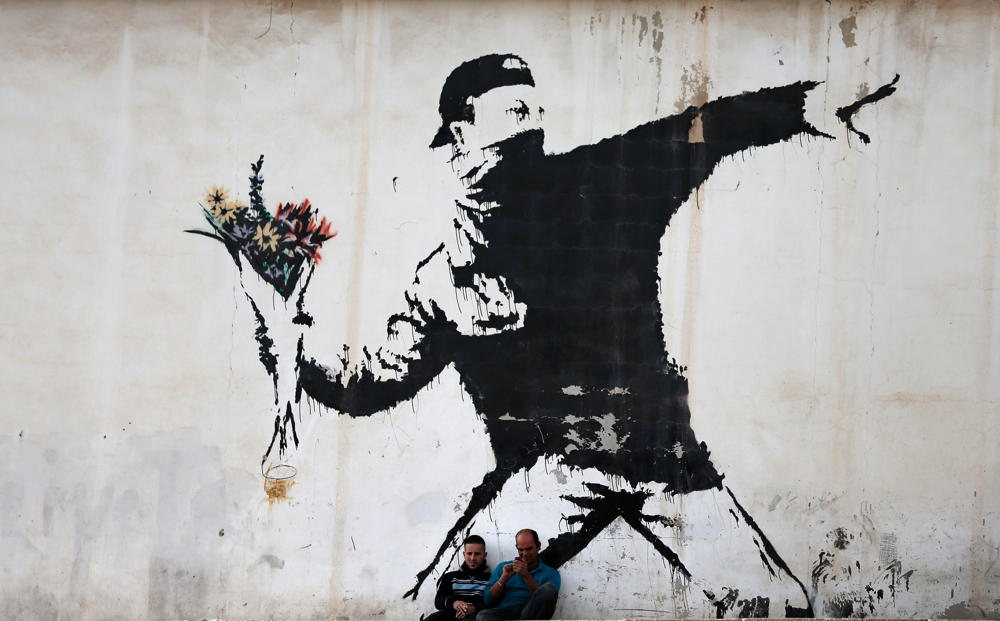

In [58]:
# Check that the keys correspond to valid paths
Image.open(list(b.keys())[-1])